In [ ]:
# Step 1: Import Libraries
import tensorflow as tf
from tensorflow.keras import layers, models
import cv2
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np
import pandas as pd
import numpy as np
import os
from glob import glob
import IPython.display as ipd
import subprocess

Read video file***nakawa output***

In [ ]:
# Path to the video file
video_path = r"D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\nakawa_output.avi"
cap = cv2.VideoCapture(video_path)
image = cap.read()
image

(True,
 array([[[249, 253, 239],
         [250, 254, 240],
         [250, 254, 240],
         ...,
         [ 25,  30,  30],
         [ 25,  30,  30],
         [ 25,  30,  30]],
 
        [[243, 247, 233],
         [245, 249, 235],
         [248, 252, 238],
         ...,
         [ 25,  30,  30],
         [ 25,  30,  30],
         [ 25,  30,  30]],
 
        [[248, 252, 238],
         [249, 253, 239],
         [250, 254, 240],
         ...,
         [ 25,  30,  30],
         [ 25,  30,  30],
         [ 25,  30,  30]],
 
        ...,
 
        [[158, 180, 190],
         [158, 180, 190],
         [158, 180, 190],
         ...,
         [ 76, 122, 133],
         [ 69, 118, 128],
         [ 72, 121, 131]],
 
        [[158, 180, 190],
         [158, 180, 190],
         [158, 180, 190],
         ...,
         [ 55,  99, 110],
         [ 61, 105, 116],
         [ 73, 117, 128]],
 
        [[158, 180, 190],
         [158, 180, 190],
         [158, 180, 190],
         ...,
         [ 32,  76,  

obtain frames from video

In [ ]:
#create image frames
success, image = cap.read()
count = 0
while success:
    cv2.imwrite(r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/%d.png" % count, image)
    count += 1
    success, image = cap.read()

# Release the video capture object
cap.release()

resize obtained frames

In [ ]:
import cv2
import os

# Directory containing the frames
frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/"

# Directory to save resized frames
resized_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/resized_frames/"

# Desired resolution
new_width = 224
new_height = 224

# Create the directory to store resized frames if it doesn't exist
if not os.path.exists(resized_frames_directory):
    os.makedirs(resized_frames_directory)

# Loop through each frame image file in the directory
for filename in os.listdir(frames_directory):
    if filename.endswith(".png"):
        # Read the frame image
        frame_path = os.path.join(frames_directory, filename)
        frame = cv2.imread(frame_path)

        # Resize the frame
        resized_frame = cv2.resize(frame, (new_width, new_height))

        # Save the resized frame to the new directory
        resized_frame_path = os.path.join(resized_frames_directory, filename)
        cv2.imwrite(resized_frame_path, resized_frame)

print("Frames resized and saved successfully.")


Frames resized and saved successfully.


determine number of obtained frames

In [ ]:
import os

# Directory containing the resized frames
resized_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/resized_frames/"

# Count the number of files in the resized frames directory
total_resized_frames = len([name for name in os.listdir(resized_frames_directory) if os.path.isfile(os.path.join(resized_frames_directory, name))])

# Output the total number of resized frames
print("Total number of resized frames:", total_resized_frames)


Total number of resized frames: 74821


denoise images

In [ ]:
import cv2
import os

# Directory containing the resized frames
resized_frames_directory =  r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/resized_frames/"

# Directory to save denoised frames
denoised_frames_directory =  r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/denoised_frames/"

# Create the directory to store denoised frames if it doesn't exist
if not os.path.exists(denoised_frames_directory):
    os.makedirs(denoised_frames_directory)

# Parameters for denoising
h = 10 # strength of the edges
templateWindowSize = 7 # size of the window used to compute weighted average for a pixel
searchWindowSize = 21 # size of the window used to search for neighbors to compute weighted average for a pixel

# Loop through each frame image file in the directory
for filename in os.listdir(resized_frames_directory):
    if filename.endswith(".png"):
        # Read the resized frame image
        resized_frame_path = os.path.join(resized_frames_directory, filename)
        resized_frame = cv2.imread(resized_frame_path)

        # Apply denoising
        denoised_frame = cv2.fastNlMeansDenoisingColored(resized_frame, None, h, h, templateWindowSize, searchWindowSize)

        # Save the denoised frame to the new directory
        denoised_frame_path = os.path.join(denoised_frames_directory, filename)
        cv2.imwrite(denoised_frame_path, denoised_frame)

print("Frames denoised and saved successfully.")


Frames denoised and saved successfully.


contrast adjustiment

In [ ]:
import cv2
import os

# Directory containing the denoised frames
selected_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/selected_frames/"

# Directory to save frames with adjusted contrast
contrast_adjusted_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/contrast_adjusted_frames/"

# Create the directory to store frames with adjusted contrast if it doesn't exist
if not os.path.exists(contrast_adjusted_frames_directory):
    os.makedirs(contrast_adjusted_frames_directory)

# Loop through each denoised frame image file in the directory
for filename in os.listdir(denoised_frames_directory):
    if filename.endswith(".png"):
        # Read the denoised frame image
        denoised_frame_path = os.path.join(denoised_frames_directory, filename)
        denoised_frame = cv2.imread(denoised_frame_path)

        # Convert the frame to grayscale
        gray_frame = cv2.cvtColor(denoised_frame, cv2.COLOR_BGR2GRAY)

        # Apply histogram equalization for contrast adjustment
        equalized_frame = cv2.equalizeHist(gray_frame)

        # Convert the equalized frame back to BGR color space
        contrast_adjusted_frame = cv2.cvtColor(equalized_frame, cv2.COLOR_GRAY2BGR)

        # Save the frame with adjusted contrast to the new directory
        contrast_adjusted_frame_path = os.path.join(contrast_adjusted_frames_directory, filename)
        cv2.imwrite(contrast_adjusted_frame_path, contrast_adjusted_frame)

print("Frames with adjusted contrast saved successfully.")


Frames with adjusted contrast saved successfully.


histogram equalisation

In [ ]:
import cv2
import os

# Directory containing the denoised frames
denoised_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/contrast_adjusted_frames/"

# Directory to save frames with histogram equalization applied
equalized_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/equalized_frames/"

# Create the directory to store frames with histogram equalization applied if it doesn't exist
if not os.path.exists(equalized_frames_directory):
    os.makedirs(equalized_frames_directory)

# Loop through each denoised frame image file in the directory
for filename in os.listdir(denoised_frames_directory):
    if filename.endswith(".png"):
        # Read the denoised frame image
        denoised_frame_path = os.path.join(denoised_frames_directory, filename)
        denoised_frame = cv2.imread(denoised_frame_path)

        # Convert the frame to grayscale
        gray_frame = cv2.cvtColor(denoised_frame, cv2.COLOR_BGR2GRAY)

        # Apply histogram equalization
        equalized_frame = cv2.equalizeHist(gray_frame)

        # Save the frame with histogram equalization applied to the new directory
        equalized_frame_path = os.path.join(equalized_frames_directory, filename)
        cv2.imwrite(equalized_frame_path, equalized_frame)

print("Frames with histogram equalization applied saved successfully.")


Frames with histogram equalization applied saved successfully.


normalisation of frames

In [ ]:
import cv2
import os
import numpy as np

# Directory containing the equalized frames
equalized_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/equalized_frames/"

# Directory to save normalized frames
normalized_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/normalized_frames/"

# Create the directory to store normalized frames if it doesn't exist
if not os.path.exists(normalized_frames_directory):
    os.makedirs(normalized_frames_directory)

# Loop through each equalized frame image file in the directory
for filename in os.listdir(equalized_frames_directory):
    if filename.endswith(".png"):
        # Read the equalized frame image
        equalized_frame_path = os.path.join(equalized_frames_directory, filename)
        equalized_frame = cv2.imread(equalized_frame_path)

        # Normalize pixel values to a common scale (e.g., 0 to 1)
        normalized_frame = equalized_frame.astype(np.float32) / 255.0

        # Save the normalized frame to the new directory
        normalized_frame_path = os.path.join(normalized_frames_directory, filename)
        cv2.imwrite(normalized_frame_path, (normalized_frame * 255).astype(np.uint8))  # Convert back to uint8 for saving

print("Frames normalized and saved successfully.")


Frames normalized and saved successfully.


unique normalised frames

In [ ]:
import cv2
import os
import numpy as np

# Directory containing the normalized frames
normalized_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/normalized_frames/"

# Directory to save unique normalized frames
unique_normalized_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/unique_normalized_frames/"

# Create the directory to store unique normalized frames if it doesn't exist
if not os.path.exists(unique_normalized_frames_directory):
    os.makedirs(unique_normalized_frames_directory)

# Function to calculate frame difference
def frame_difference(frame1, frame2):
    # Convert frames to grayscale
    gray_frame1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
    gray_frame2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    # Calculate absolute difference between frames
    frame_diff = cv2.absdiff(gray_frame1, gray_frame2)
    return frame_diff

# Initialize variables
prev_frame = None
frame_count = 0

# Loop through each normalized frame image file in the directory
for filename in sorted(os.listdir(normalized_frames_directory)):
    if filename.endswith(".png"):
        # Read the normalized frame image
        normalized_frame_path = os.path.join(normalized_frames_directory, filename)
        normalized_frame = cv2.imread(normalized_frame_path)

        # If it's the first frame, save it as unique
        if prev_frame is None:
            unique_frame_path = os.path.join(unique_normalized_frames_directory, f"unique_frame_{frame_count:04d}.png")
            cv2.imwrite(unique_frame_path, normalized_frame)
            prev_frame = normalized_frame
            frame_count += 1
        else:
            # Calculate frame difference
            diff = frame_difference(prev_frame, normalized_frame)
            # If frame difference is above a certain threshold, save it as unique
            if np.mean(diff) > 20:  # You might need to adjust the threshold based on your video content
                unique_frame_path = os.path.join(unique_normalized_frames_directory, f"unique_frame_{frame_count:04d}.png")
                cv2.imwrite(unique_frame_path, normalized_frame)
                prev_frame = normalized_frame
                frame_count += 1

print("Unique frames selected and saved successfully.")


Unique frames selected and saved successfully.


count of selected unique frames

In [ ]:
import os

def count_frames(directory_path):
    """
    Count the total number of frames in the specified directory.

    Args:
    - directory_path (str): Path to the directory containing frames.

    Returns:
    - total_frames (int): Total number of frames in the directory.
    """
    # Initialize frame count
    total_frames = 0

    # Loop through each file in the directory
    for filename in os.listdir(directory_path):
        # Check if the file is a frame (assuming it ends with ".png")
        if filename.endswith(".png"):
            total_frames += 1

    return total_frames

# Example usage:
unique_normalized_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/unique_normalized_frames/"
total_frames = count_frames(unique_normalized_frames_directory)
print("Total number of frames:", total_frames)


Total number of frames: 13574


data augmentation

In [ ]:
import cv2
import os

# Directory containing the original images
unique_normalized_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/unique_normalized_frames/"

# Directory to save augmented images
augmented_images_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/augmented_frames/"

# Function to apply flipping and rotation to images
def augment_image(image, filename):
    # Flip the image horizontally
    flipped_image = cv2.flip(image, 1)
    save_image(flipped_image, "flipped_" + filename)

    # Flip the image vertically
    flipped_image = cv2.flip(image, 0)
    save_image(flipped_image, "flipped_vertical_" + filename)

    # Rotate the image by 90 degrees clockwise
    rotated_image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
    save_image(rotated_image, "rotated_90_" + filename)

    # Rotate the image by 180 degrees
    rotated_image = cv2.rotate(image, cv2.ROTATE_180)
    save_image(rotated_image, "rotated_180_" + filename)

    # Rotate the image by 270 degrees clockwise
    rotated_image = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    save_image(rotated_image, "rotated_270_" + filename)

# Function to save augmented images
def save_image(image, filename):
    save_path = os.path.join(augmented_images_directory, filename)
    cv2.imwrite(save_path, image)

# Create the directory to save augmented images if it doesn't exist
if not os.path.exists(augmented_images_directory):
    os.makedirs(augmented_images_directory)

# Loop through each image file in the original images directory
for filename in os.listdir(unique_normalized_frames_directory):
    if filename.endswith(".png") or filename.endswith(".jpg"):
        # Read the image
        image_path = os.path.join(unique_normalized_frames_directory, filename)
        image = cv2.imread(image_path)

        # Apply flipping and rotation to the image
        augment_image(image, filename)

print("Augmented images saved successfully.")


Augmented images saved successfully.


adding random noise

In [ ]:
import cv2
import os
import numpy as np

# Directory containing the augmented images
augmented_images_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/augmented_frames/"

# Directory to save images with added noise
noisy_images_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/noised_frames/"

# Function to add random noise to images
def add_noise(image, filename):
    # Generate random noise with the same shape as the image
    noise = np.random.normal(loc=0, scale=25, size=image.shape).astype(np.uint8)

    # Add the noise to the image
    noisy_image = cv2.add(image, noise)

    # Save the noisy image
    save_path = os.path.join(noisy_images_directory, "noisy_" + filename)
    cv2.imwrite(save_path, noisy_image)

# Create the directory to save noisy images if it doesn't exist
if not os.path.exists(noisy_images_directory):
    os.makedirs(noisy_images_directory)

# Loop through each image file in the augmented images directory
for filename in os.listdir(augmented_images_directory):
    if filename.endswith(".png") or filename.endswith(".jpg"):
        # Read the image
        image_path = os.path.join(augmented_images_directory, filename)
        image = cv2.imread(image_path)

        # Add random noise to the image
        add_noise(image, filename)

print("Noisy images saved successfully.")


Noisy images saved successfully.


edge detection

In [ ]:
import cv2
import os

# Directory containing the normalized frames
normalized_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/normalized_frames/"

# Directory to save frames with edges detected
edges_detected_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/edges_detected_frames/"

# Create the directory to store frames with edges detected if it doesn't exist
if not os.path.exists(edges_detected_directory):
    os.makedirs(edges_detected_directory)

# Loop through each normalized frame image file in the directory
for filename in os.listdir(normalized_frames_directory):
    if filename.endswith(".png"):
        # Read the normalized frame image
        normalized_frame_path = os.path.join(normalized_frames_directory, filename)
        normalized_frame = cv2.imread(normalized_frame_path)

        # Convert the frame to grayscale
        gray_frame = cv2.cvtColor(normalized_frame, cv2.COLOR_BGR2GRAY)

        # Apply edge detection (Canny edge detector)
        edges = cv2.Canny(gray_frame, threshold1=50, threshold2=150)  # Adjust thresholds as needed

        # Save the frame with edges detected to the new directory
        edges_detected_frame_path = os.path.join(edges_detected_directory, filename)
        cv2.imwrite(edges_detected_frame_path, edges)

print("Frames with edges detected saved successfully.")

Frames with edges detected saved successfully.


select Unique frames

In [ ]:
import cv2
import os
import numpy as np

# Directory containing the frames with edges detected
edges_detected_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/edges_detected_frames/"

# Directory to save selected unique frames
selected_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/selected_frames/"

# Create the directory to store selected unique frames if it doesn't exist
if not os.path.exists(selected_frames_directory):
    os.makedirs(selected_frames_directory)

# Initialize a list to store unique frame pixel values
unique_frames = []

# Loop through each frame image file in the edges_detected_directory
for filename in os.listdir(edges_detected_directory):
    if filename.endswith(".png"):
        # Read the frame image
        frame_path = os.path.join(edges_detected_directory, filename)
        frame = cv2.imread(frame_path)

        # Convert the frame to grayscale
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Calculate the average pixel value of the frame
        average_pixel_value = np.mean(gray_frame)

        # Check if the frame is unique based on its average pixel value
        if average_pixel_value not in unique_frames:
            # Add the average pixel value to the list of unique frames
            unique_frames.append(average_pixel_value)

            # Save the selected unique frame to the new directory
            selected_frame_path = os.path.join(selected_frames_directory, filename)
            cv2.imwrite(selected_frame_path, frame)

print("Selected unique frames saved successfully.")


Selected unique frames saved successfully.


count of unique-selected frames

***EDA on Selected frames***

Visualize distribution of pixel intensities

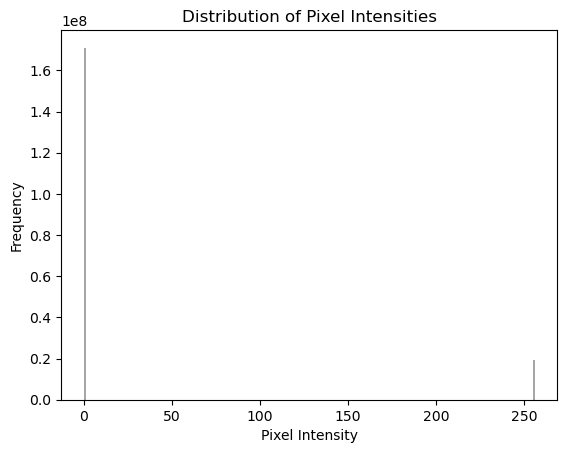

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

# Directory containing the selected frames
selected_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/selected_frames/"

# Initialize an empty list to store pixel intensities
pixel_intensities = []

# Loop through each frame image file in the selected_frames_directory
for filename in os.listdir(selected_frames_directory):
    if filename.endswith(".png"):
        # Read the frame image
        frame_path = os.path.join(selected_frames_directory, filename)
        frame = cv2.imread(frame_path)

        # Convert the frame to grayscale
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Flatten the grayscale image array to 1D
        flattened_frame = gray_frame.flatten()

        # Add pixel intensities to the list
        pixel_intensities.extend(flattened_frame)

# Convert the list of pixel intensities to a NumPy array
pixel_intensities = np.array(pixel_intensities)

# Plot the histogram of pixel intensities
plt.hist(pixel_intensities, bins=256, range=(0, 256), color='gray', alpha=0.7)
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.title('Distribution of Pixel Intensities')
plt.show()


Plot histograms of pixel intensity values.

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

# Directory containing the selected frames
selected_frames_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/selected_frames/"

# Create a directory to save histograms if it doesn't exist
histograms_directory = r"D:/COURSE STAFF/2nd SEMESTER/COMPUTER VISION/Traffic-video-files/histograms/"
if not os.path.exists(histograms_directory):
    os.makedirs(histograms_directory)

# Loop through each frame image file in the selected_frames_directory
for filename in os.listdir(selected_frames_directory):
    if filename.endswith(".png"):
        # Read the frame image
        frame_path = os.path.join(selected_frames_directory, filename)
        frame = cv2.imread(frame_path)

        # Convert the frame to grayscale
        gray_frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Calculate histogram of pixel intensities
        hist, bins = np.histogram(gray_frame.flatten(), bins=256, range=(0,256))

        # Plot histogram
        plt.figure()
        plt.plot(hist, color='black')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Frequency')
        plt.title('Histogram of Pixel Intensity for {}'.format(filename))
        plt.savefig(os.path.join(histograms_directory, filename.split('.')[0] + '_histogram.png'))  # Save histogram plot
        plt.close()

print("Histograms of pixel intensity values plotted successfully.")


Histograms of pixel intensity values plotted successfully.


Show a sample of frames

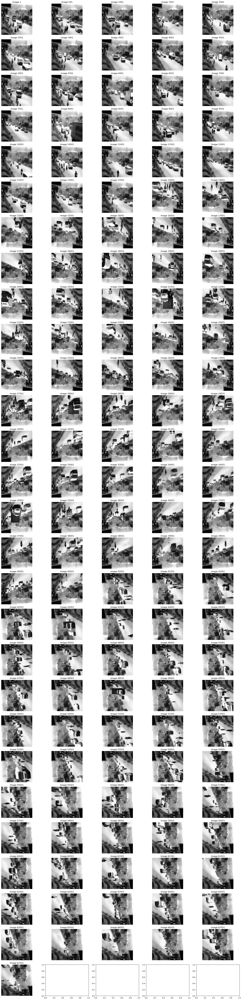

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Directory containing the images
image_directory = r"D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\augmented_frames"

# Get list of image files
image_files = [os.path.join(image_directory, file) for file in os.listdir(image_directory) if file.endswith(".png")]

# Get indices of images in multiples of 50
indices = range(0, len(image_files), 500)

# Calculate number of rows
num_rows = (len(indices) + 4) // 5  # Adjusted to handle cases where there are fewer images

# Display images in a grid of 5 columns and num_rows rows
fig, axes = plt.subplots(num_rows, 5, figsize=(20, 80))

for i, index in enumerate(indices):
    row_index = i // 5
    col_index = i % 5

    # Load image if index is within range
    if index < len(image_files):
        image = Image.open(image_files[index])

        # Display image
        axes[row_index, col_index].imshow(image)
        axes[row_index, col_index].set_title(f"Image {index+1}")
        axes[row_index, col_index].axis("off")
    else:
        # If index is out of range, remove the corresponding subplot
        fig.delaxes(axes[row_index, col_index])

plt.tight_layout()
plt.show()


convert XML files to a pandas dataframe

In [ ]:
import os
import xml.etree.ElementTree as ET
import pandas as pd

# Function to parse XML file and convert to DataFrame
def xml_to_dataframe(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    data = []
    for object_elem in root.findall('object'):
        item = {}
        item['filename'] = root.find('filename').text
        item['object_name'] = object_elem.find('name').text
        item['xmin'] = int(object_elem.find('bndbox/xmin').text)
        item['ymin'] = int(object_elem.find('bndbox/ymin').text)
        item['xmax'] = int(object_elem.find('bndbox/xmax').text)
        item['ymax'] = int(object_elem.find('bndbox/ymax').text)
        data.append(item)
    return pd.DataFrame(data)

# Directory containing XML files
xml_directory = r'D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\augmented_frames'

# Initialize an empty list to store DataFrames
dataframes = []

# Iterate over each XML file in the directory
for filename in os.listdir(xml_directory):
    if filename.endswith('.xml'):
        xml_file = os.path.join(xml_directory, filename)
        df = xml_to_dataframe(xml_file)
        dataframes.append(df)

# Concatenate all DataFrames into a single DataFrame
final_df = pd.concat(dataframes, ignore_index=True)

# Save the final DataFrame to a CSV file
csv_file = os.path.join(xml_directory, 'labelled_Image.csv')
final_df.to_csv(csv_file, index=False)

# Now you have all your XML data from multiple files in a single Pandas DataFrame
print(final_df)


                           filename  object_name  xmin  ymin  xmax  ymax
0     flipped_unique_frame_0000.png  cargo truck    81    86   109   131
1     flipped_unique_frame_0000.png   motorcycle    79   134    96   168
2     flipped_unique_frame_0000.png         taxi   112   129   150   178
3     flipped_unique_frame_0001.png  cargo truck   104    93   145   159
4     flipped_unique_frame_0001.png   motorcycle   198   133   212   163
...                             ...          ...   ...   ...   ...   ...
5026  flipped_unique_frame_8063.png         taxi   133   133   182   198
5027  flipped_unique_frame_8065.png         taxi   141   139   195   205
5028  flipped_unique_frame_8066.png  cargo truck   122   103   169   177
5029  flipped_unique_frame_8158.png  cargo truck    73    86   121   145
5030  flipped_unique_frame_8179.png  cargo truck    83    86   135   160

[5031 rows x 6 columns]


In [ ]:
final_df.head(10)

,filename,object_name,xmin,ymin,xmax,ymax
0,flipped_unique_frame_0000.png,cargo truck,81,86,109,131
1,flipped_unique_frame_0000.png,motorcycle,79,134,96,168
2,flipped_unique_frame_0000.png,taxi,112,129,150,178
3,flipped_unique_frame_0001.png,cargo truck,104,93,145,159
4,flipped_unique_frame_0001.png,motorcycle,198,133,212,163
5,flipped_unique_frame_0001.png,taxi,143,111,168,146
6,flipped_unique_frame_0002.png,taxi,106,123,140,172
7,flipped_unique_frame_0002.png,taxi,66,110,99,147
8,flipped_unique_frame_0003.png,motorcycle,98,125,112,160
9,flipped_unique_frame_0003.png,private car,122,124,155,164


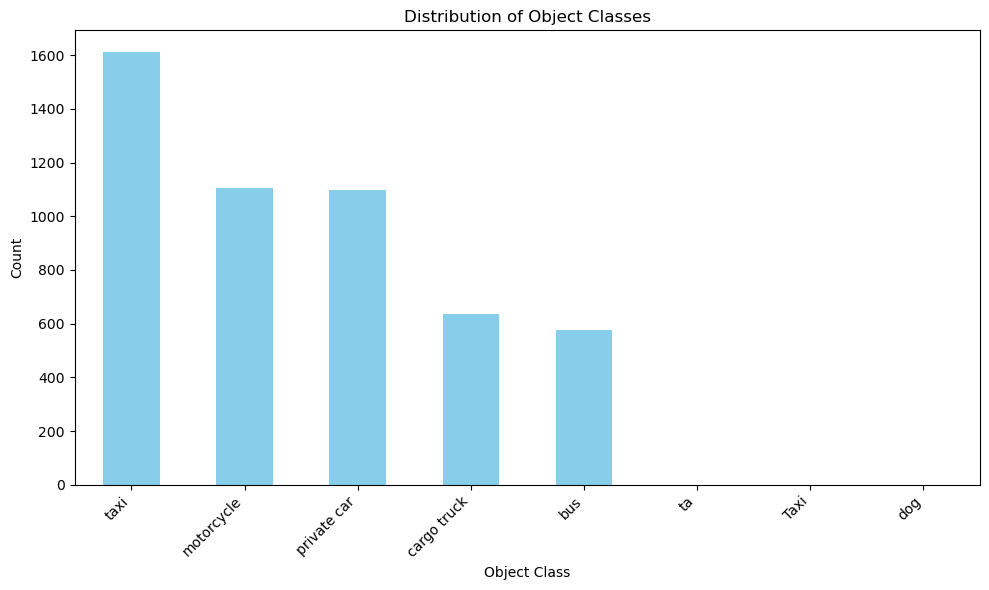

In [ ]:
import matplotlib.pyplot as plt

# Count occurrences of each object class
class_counts = final_df['object_name'].value_counts()

# Plot a bar chart
plt.figure(figsize=(10, 6))
class_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Object Classes')
plt.xlabel('Object Class')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

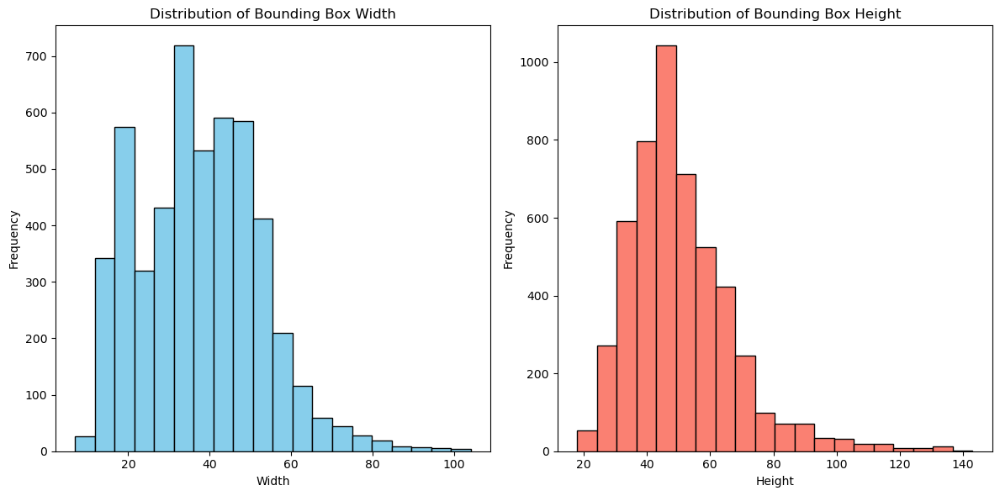

In [ ]:
import matplotlib.pyplot as plt
df=final_df

# Calculate width and height of each bounding box
df['width'] = df['xmax'] - df['xmin']
df['height'] = df['ymax'] - df['ymin']

# Create histograms for width and height
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(df['width'], bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Bounding Box Width')
plt.xlabel('Width')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(df['height'], bins=20, color='salmon', edgecolor='black')
plt.title('Distribution of Bounding Box Height')
plt.xlabel('Height')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


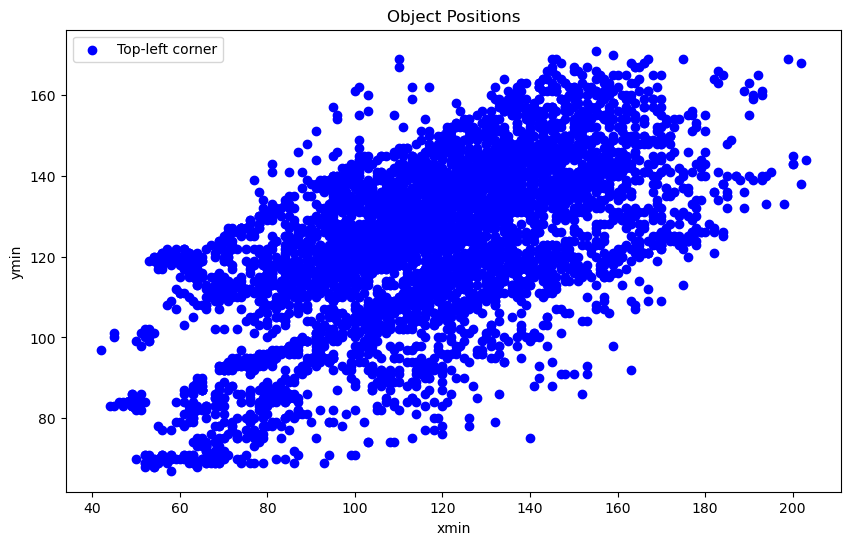

In [ ]:
# 4. Object Positions
plt.figure(figsize=(10, 6))
plt.scatter(df['xmin'], df['ymin'], c='blue', label='Top-left corner')
plt.title('Object Positions')
plt.xlabel('xmin')
plt.ylabel('ymin')
plt.legend()
plt.show()

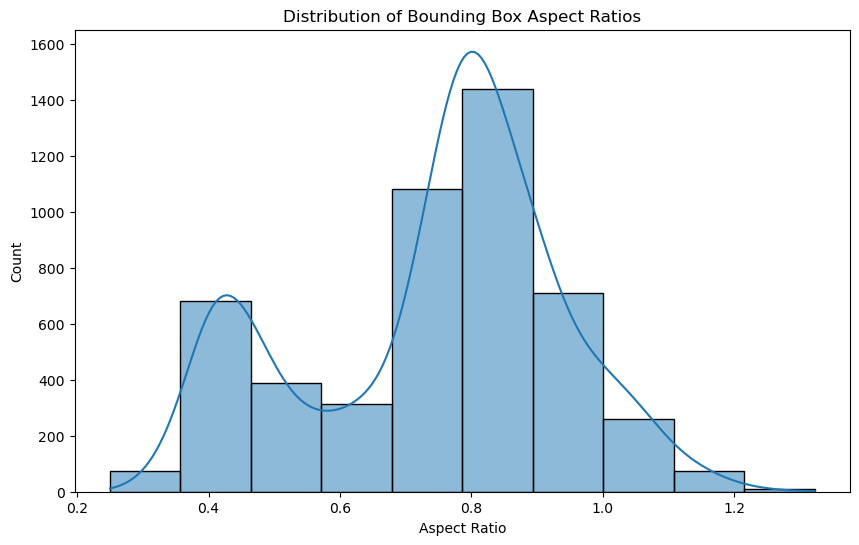

In [ ]:
# 5. Aspect Ratio of Bounding Boxes
df=final_df
df['aspect_ratio'] = df['width'] / df['height']
plt.figure(figsize=(10, 6))
sns.histplot(df['aspect_ratio'], bins=10, kde=True)
plt.title('Distribution of Bounding Box Aspect Ratios')
plt.xlabel('Aspect Ratio')
plt.ylabel('Count')
plt.show()

In [ ]:
Extract labelled Frames from XML files

In [ ]:
import os
import cv2
import xml.etree.ElementTree as ET

def extract_objects_from_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    objects = []
    for obj in root.findall('object'):
        obj_info = {}
        obj_info['name'] = obj.find('name').text
        bbox = obj.find('bndbox')
        obj_info['xmin'] = int(bbox.find('xmin').text)
        obj_info['ymin'] = int(bbox.find('ymin').text)
        obj_info['xmax'] = int(bbox.find('xmax').text)
        obj_info['ymax'] = int(bbox.find('ymax').text)
        objects.append(obj_info)
    return objects

def crop_and_save_images(xml_folder, image_folder, output_folder):
    for xml_file in os.listdir(xml_folder):
        if xml_file.endswith('.xml'):
            image_name = os.path.splitext(xml_file)[0] + '.png'
            image_path = os.path.join(image_folder, image_name)
            if not os.path.exists(image_path):
                print(f"Error: Image file '{image_name}' not found.")
                continue
            xml_path = os.path.join(xml_folder, xml_file)
            objects = extract_objects_from_xml(xml_path)
            img = cv2.imread(image_path)
            if img is None:
                print(f"Error: Unable to read image '{image_name}'.")
                continue

            # Print statements within the loop
            print(f"Processing XML file: {xml_file}")
            print(f"Image path: {image_path}")

            for obj in objects:
                obj_name = obj['name']
                xmin, ymin, xmax, ymax = obj['xmin'], obj['ymin'], obj['xmax'], obj['ymax']
                cropped_img = img[ymin:ymax, xmin:xmax]
                output_path = os.path.join(output_folder, f"{obj_name}_{xml_file.replace('.xml', '')}.png")
                cv2.imwrite(output_path, cropped_img)

# Specify the directories
xml_directory = r'D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\augmented_frames'
image_directory = r'D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\augmented_frames'  # Assuming images are in a separate folder
output_directory = r'D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\labelled-images'

# Create the output directory if it doesn't exist
if not os.path.exists(output_directory):
    os.makedirs(output_directory)

# Call the function to crop and save images
crop_and_save_images(xml_directory, image_directory, output_directory)


Processing XML file: flipped_unique_frame_0000.xml
Image path: D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\augmented_frames\flipped_unique_frame_0000.png
Processing XML file: flipped_unique_frame_0001.xml
Image path: D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\augmented_frames\flipped_unique_frame_0001.png
Processing XML file: flipped_unique_frame_0002.xml
Image path: D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\augmented_frames\flipped_unique_frame_0002.png
Processing XML file: flipped_unique_frame_0003.xml
Image path: D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\augmented_frames\flipped_unique_frame_0003.png
Processing XML file: flipped_unique_frame_0004.xml
Image path: D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\augmented_frames\flipped_unique_frame_0004.png
Processing XML file: flipped_unique_frame_0005.xml
Image path: D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-fil

In [ ]:
import os
import shutil

# Define the source and destination directories
source_directory = r'D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\labelled-images'
destination_directory = r'D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\final-images'

# Create the destination directory if it doesn't exist
if not os.path.exists(destination_directory):
    os.makedirs(destination_directory)

# Define a mapping of keywords to new names
category_mapping = {
    'bus': 'bus',
    'cargo truck': 'cargo truck',
    'motorcycle': 'motorcycle',
    'private car': 'private car',
    'taxi': 'taxi'
}

# Iterate over each file in the source directory
for filename in os.listdir(source_directory):
    # Check if the file matches any category keyword
    for keyword, new_name in category_mapping.items():
        if keyword in filename:
            # Construct the new filename
            new_filename = new_name + '_' + filename.split('_')[-1]
            # Construct the full file paths
            src = os.path.join(source_directory, filename)
            dst = os.path.join(destination_directory, new_filename)
            # Copy the file to the new destination with the new name
            shutil.copy(src, dst)
            break

print("Renaming and copying completed successfully.")


Renaming and copying completed successfully.


In [ ]:
import os
import shutil

# Source directory containing all images
source_directory = r'D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\final-images'

# Destination directory where organized images will be stored
destination_directory = r'D:\COURSE STAFF\2nd SEMESTER\COMPUTER VISION\Traffic-video-files\final-organized'

# Define class names
class_names = ['bus', 'cargo truck', 'motorcycle', 'taxi', 'private car']

# Create destination directories if they do not exist
for class_name in class_names:
    os.makedirs(os.path.join(destination_directory, class_name), exist_ok=True)

# Iterate over each file in the source directory
for filename in os.listdir(source_directory):
    for class_name in class_names:
        if class_name in filename:
            # Construct the source and destination file paths
            src = os.path.join(source_directory, filename)
            dst = os.path.join(destination_directory,pai class_name, filename)
            # Copy the file to the destination directory with the new name
            shutil.copy(src, dst)
            break

print("Organizing images completed successfully.")



Organizing images completed successfully.


In [ ]:
pip install h5py

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


DATA PREPARATION FOR MACHINE LEARNING

Environment Preparation

In [24]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report, roc_curve, auc

In [25]:
# Directory containing the extracted frames
extracted_frames_dir = '/content/drive/My Drive/final-organized'

# Parameters
image_size = (64, 64)
labels = []
features = []

# Load images and prepare data
for label_dir in os.listdir(extracted_frames_dir):
    label_path = os.path.join(extracted_frames_dir, label_dir)
    if os.path.isdir(label_path):
        for image_file in os.listdir(label_path):
            image_path = os.path.join(label_path, image_file)
            image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            if image is not None:
                image_resized = cv2.resize(image, image_size)
                features.append(image_resized.flatten())
                labels.append(label_dir)

features = np.array(features)
labels = np.array(labels)


In [26]:
import shutil

# Path to the dataset
data = '/content/drive/My Drive/final-organized'

# List of all classes in the dataset directory
classes = os.listdir(data)
print("Classes: {}".format(classes))

# Set the test split ratio
test_split = 0.3

# Create separate directories for the training and test sets
# the train directory
train_dir = 'training'
shutil.rmtree(train_dir, ignore_errors=True)
os.mkdir(train_dir)

# the test directory
test_dir = 'testing'
shutil.rmtree(test_dir, ignore_errors=True)
os.mkdir(test_dir)

# Split the data into training and validation sets
for class_name in classes:
    class_dir = os.path.join(data, class_name)
    train_class_dir = os.path.join(train_dir, class_name)
    test_class_dir = os.path.join(test_dir, class_name)

    os.makedirs(train_class_dir, exist_ok=True)
    os.makedirs(test_class_dir, exist_ok=True)

    # Get the list of images in the class directory
    images = os.listdir(class_dir)
    num_images = len(images)
    num_test = int(test_split * num_images)

    # Move images to the training directory
    for img in images[:-num_test]:
        src_path = os.path.join(class_dir, img)
        dst_path = os.path.join(train_class_dir, img)
        shutil.copy(src_path, dst_path)

    # Move images to the test directory
    for img in images[-num_test:]:
        src_path = os.path.join(class_dir, img)
        dst_path = os.path.join(test_class_dir, img)



Classes: ['motorcycle', 'cargo truck', 'taxi']


Classes: ['motorcycle', 'cargo truck', 'taxi']


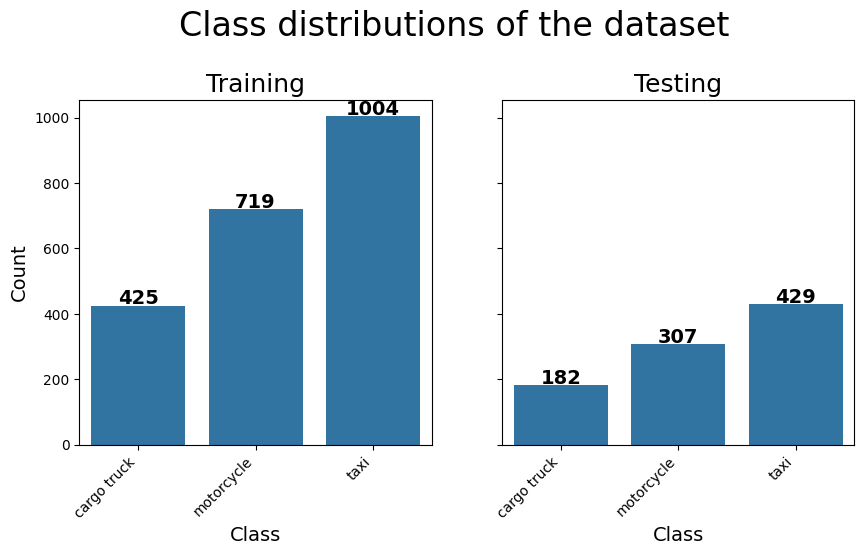

In [27]:
# Function to get class distribution
def get_class_distribution(directory):
    class_labels = []
    for root, dirs, files in os.walk(directory):
        if len(files) > 0:
            class_name = os.path.basename(root)
            class_labels.extend([class_name] * len(files))

    class_labels = np.array(class_labels)
    unique_labels, label_indices = np.unique(class_labels, return_inverse=True)
    class_counts = np.bincount(label_indices)
    return unique_labels, class_counts

# Function to plot class distribution
def plot_class_distribution(data, title, ax):
    labels = np.arange(len(data[1]))
    counts = data[1]
    class_names = data[0]

    ax = sns.barplot(ax=ax, x=labels, y=counts)
    ax.set_title(title, fontsize=18)
    ax.set_xlabel('Class', fontsize=14)
    ax.set_ylabel('Count', fontsize=14)
    ax.set_xticks(labels)
    ax.set_xticklabels(class_names, rotation=45, ha='right')
    for p in ax.patches:
        height = int(p.get_height())
        ax.annotate(height, (p.get_x() + p.get_width() / 2., height), ha='center', va='center', fontsize=14, color='black', xytext=(0, 5), textcoords='offset points', weight='bold')

# Function to load and prepare data
def load_data(directory, image_size):
    features = []
    labels = []
    for label_dir in os.listdir(directory):
        label_path = os.path.join(directory, label_dir)
        if os.path.isdir(label_path):
            for image_file in os.listdir(label_path):
                image_path = os.path.join(label_path, image_file)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                if image is not None:
                    image_resized = cv2.resize(image, image_size)
                    features.append(image_resized.flatten())
                    labels.append(label_dir)
    return np.array(features), np.array(labels)

# Paths and parameters
data = '/content/drive/My Drive/final-organized'
image_size = (64, 64)  # Resize images to 64x64 pixels
test_split = 0.3  # 70% training, 30% testing

# List of all classes in the dataset directory
classes = os.listdir(data)
print("Classes: {}".format(classes))

# Create separate directories for the training and test sets
train_dir = 'training'
shutil.rmtree(train_dir, ignore_errors=True)
os.mkdir(train_dir)

test_dir = 'testing'
shutil.rmtree(test_dir, ignore_errors=True)
os.mkdir(test_dir)

# Split the data into training and test sets
for class_name in classes:
    class_dir = os.path.join(data, class_name)
    train_class_dir = os.path.join(train_dir, class_name)
    test_class_dir = os.path.join(test_dir, class_name)

    os.makedirs(train_class_dir, exist_ok=True)
    os.makedirs(test_class_dir, exist_ok=True)

    # Get the list of images in the class directory
    images = os.listdir(class_dir)
    num_images = len(images)
    num_test = int(test_split * num_images)

    # Move images to the training directory
    for img in images[:-num_test]:
        src_path = os.path.join(class_dir, img)
        dst_path = os.path.join(train_class_dir, img)
        shutil.copy(src_path, dst_path)

    # Move images to the test directory
    for img in images[-num_test:]:
        src_path = os.path.join(class_dir, img)
        dst_path = os.path.join(test_class_dir, img)
        shutil.copy(src_path, dst_path)

# Load training and test data
X_train, y_train = load_data(train_dir, image_size)
X_test, y_test = load_data(test_dir, image_size)



# Plot class distributions
train_labels = get_class_distribution(train_dir)
test_labels = get_class_distribution(test_dir)

fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
fig.suptitle('Class distributions of the dataset', fontsize=24)
plt.subplots_adjust(top=0.8)

plot_class_distribution(train_labels, 'Training', axes[0])
plot_class_distribution(test_labels, 'Testing', axes[1])

plt.show()


Extract color histogram as a basis for classification

Support Vector Machine Accuracy: 0.9918
Support Vector Machine Precision: 0.9918
Support Vector Machine Recall: 0.9918
Support Vector Machine F1 Score: 0.9918
Support Vector Machine AUC: 0.9981917276740698
Confusion Matrix:
 [[ 595    1   11]
 [   0 1026    0]
 [  11    2 1420]]
              precision    recall  f1-score   support

 cargo truck       0.98      0.98      0.98       607
  motorcycle       1.00      1.00      1.00      1026
        taxi       0.99      0.99      0.99      1433

    accuracy                           0.99      3066
   macro avg       0.99      0.99      0.99      3066
weighted avg       0.99      0.99      0.99      3066





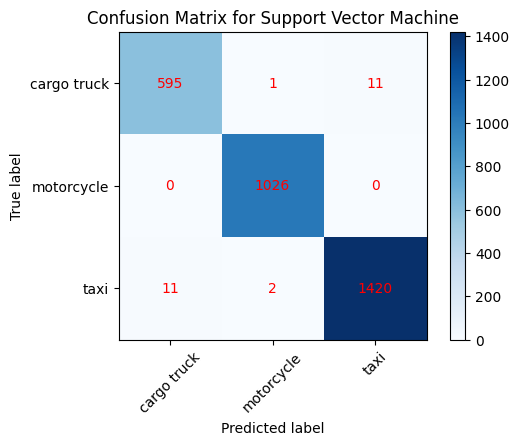

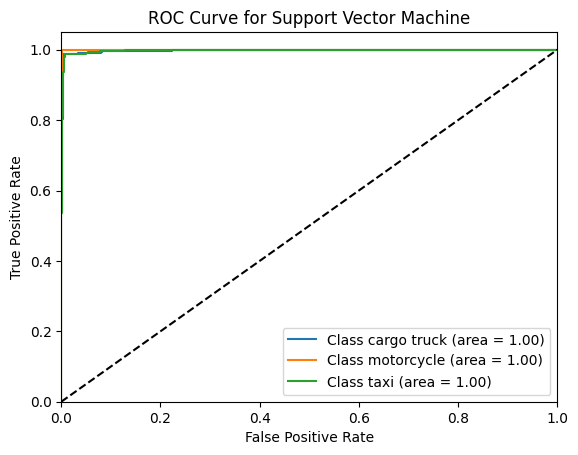

Random Forest Accuracy: 1.0000
Random Forest Precision: 1.0000
Random Forest Recall: 1.0000
Random Forest F1 Score: 1.0000
Random Forest AUC: 1.0
Confusion Matrix:
 [[ 607    0    0]
 [   0 1026    0]
 [   0    0 1433]]
              precision    recall  f1-score   support

 cargo truck       1.00      1.00      1.00       607
  motorcycle       1.00      1.00      1.00      1026
        taxi       1.00      1.00      1.00      1433

    accuracy                           1.00      3066
   macro avg       1.00      1.00      1.00      3066
weighted avg       1.00      1.00      1.00      3066





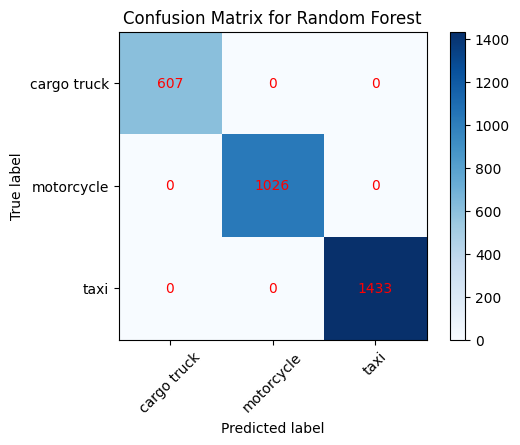

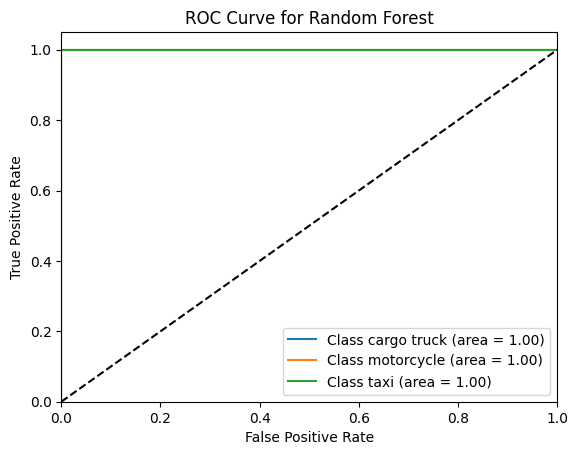

k-Nearest Neighbors Accuracy: 0.9005
k-Nearest Neighbors Precision: 0.9060
k-Nearest Neighbors Recall: 0.9005
k-Nearest Neighbors F1 Score: 0.9009
k-Nearest Neighbors AUC: 0.9887299673178805
Confusion Matrix:
 [[ 547   22   38]
 [  36  981    9]
 [  84  116 1233]]
              precision    recall  f1-score   support

 cargo truck       0.82      0.90      0.86       607
  motorcycle       0.88      0.96      0.91      1026
        taxi       0.96      0.86      0.91      1433

    accuracy                           0.90      3066
   macro avg       0.89      0.91      0.89      3066
weighted avg       0.91      0.90      0.90      3066





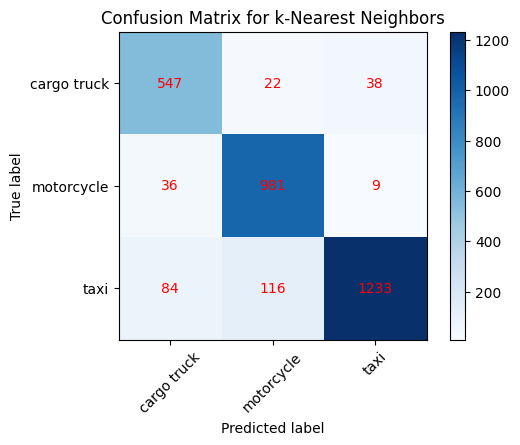

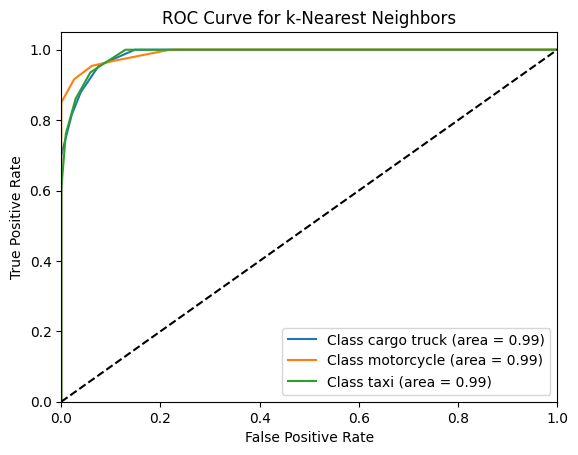

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Accuracy: 0.9808
Logistic Regression Precision: 0.9807
Logistic Regression Recall: 0.9808
Logistic Regression F1 Score: 0.9807
Logistic Regression AUC: 0.9981319597660425
Confusion Matrix:
 [[ 578    3   26]
 [   1 1020    5]
 [  17    7 1409]]
              precision    recall  f1-score   support

 cargo truck       0.97      0.95      0.96       607
  motorcycle       0.99      0.99      0.99      1026
        taxi       0.98      0.98      0.98      1433

    accuracy                           0.98      3066
   macro avg       0.98      0.98      0.98      3066
weighted avg       0.98      0.98      0.98      3066





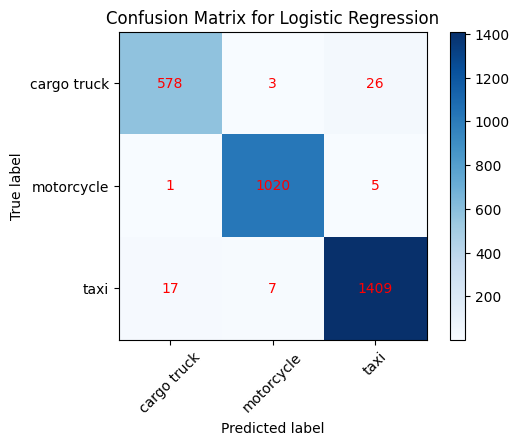

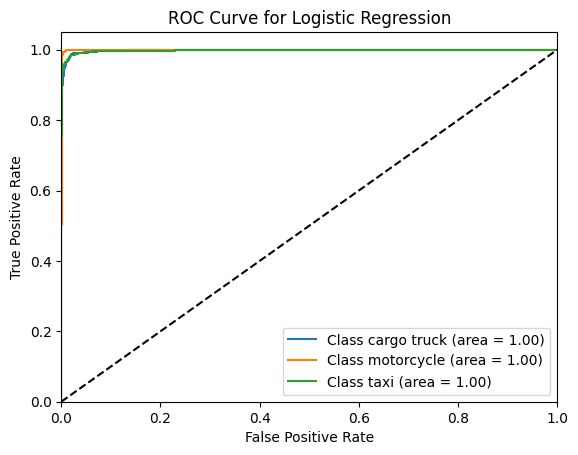

Decision Tree Accuracy: 1.0000
Decision Tree Precision: 1.0000
Decision Tree Recall: 1.0000
Decision Tree F1 Score: 1.0000
Decision Tree AUC: 1.0
Confusion Matrix:
 [[ 607    0    0]
 [   0 1026    0]
 [   0    0 1433]]
              precision    recall  f1-score   support

 cargo truck       1.00      1.00      1.00       607
  motorcycle       1.00      1.00      1.00      1026
        taxi       1.00      1.00      1.00      1433

    accuracy                           1.00      3066
   macro avg       1.00      1.00      1.00      3066
weighted avg       1.00      1.00      1.00      3066





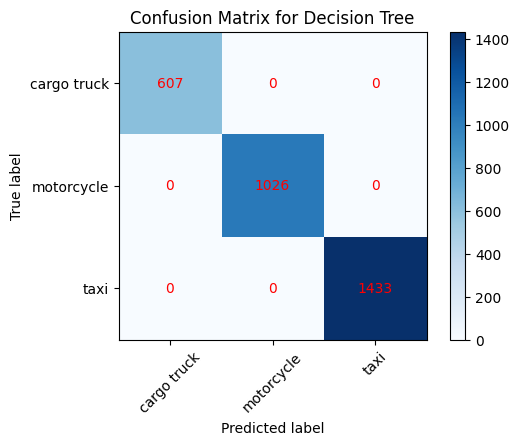

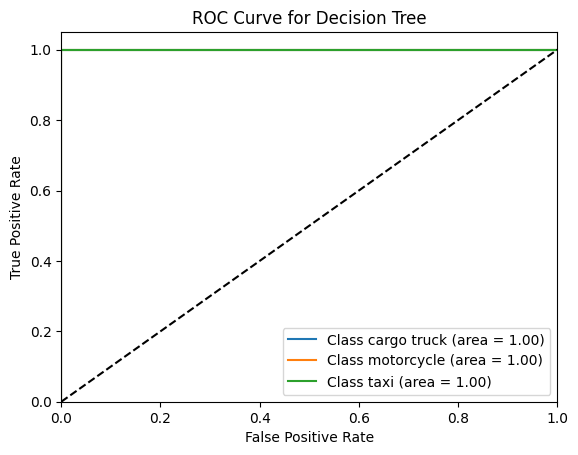

In [28]:
# Function to extract color histogram features from an image
def extract_color_histogram(image):
    # Convert the image to the HSV color space
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    # Compute the histogram for each channel (Hue, Saturation, Value)
    hist_hue = cv2.calcHist([hsv_image], [0], None, [256], [0, 256])
    hist_saturation = cv2.calcHist([hsv_image], [1], None, [256], [0, 256])
    hist_value = cv2.calcHist([hsv_image], [2], None, [256], [0, 256])

    # Normalize the histograms
    cv2.normalize(hist_hue, hist_hue, 0, 1, cv2.NORM_MINMAX)
    cv2.normalize(hist_saturation, hist_saturation, 0, 1, cv2.NORM_MINMAX)
    cv2.normalize(hist_value, hist_value, 0, 1, cv2.NORM_MINMAX)

    # Concatenate the histograms into a single feature vector
    feature_vector = np.concatenate([hist_hue, hist_saturation, hist_value]).flatten()

    return feature_vector

# Function to extract features and labels from a directory
def extract_features_from_folder(folder_path, feature_extractor):
    features = []
    labels = []

    class_folders = os.listdir(folder_path)
    for class_folder in class_folders:
        class_path = os.path.join(folder_path, class_folder)
        if os.path.isdir(class_path):
            class_label = class_folder

            image_files = os.listdir(class_path)

            for image_file in image_files:
                image_path = os.path.join(class_path, image_file)

                # Load the image
                image = cv2.imread(image_path)

                # Extract color histogram features
                extracted_features = feature_extractor(image)

                features.append(extracted_features)
                labels.append(class_label)

    return features, labels

# Paths
train_folder_path = '/content/drive/My Drive/final-organized'
test_folder_path = '/content/drive/My Drive/final-organized'

# Extract features and labels from training and test sets
train_features, train_labels = extract_features_from_folder(train_folder_path, extract_color_histogram)
test_features, test_labels = extract_features_from_folder(test_folder_path, extract_color_histogram)

# Encode labels
label_encoder = LabelEncoder()
train_labels_encoded = label_encoder.fit_transform(train_labels)
test_labels_encoded = label_encoder.transform(test_labels)

# Standardize features
scaler = StandardScaler()
train_features_scaled = scaler.fit_transform(train_features)
test_features_scaled = scaler.transform(test_features)

# Train and evaluate models
models = {
    "Support Vector Machine": SVC(kernel='linear', probability=True, random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "k-Nearest Neighbors": KNeighborsClassifier(n_neighbors=5),
    "Logistic Regression": LogisticRegression(random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42)
}

for model_name, model in models.items():
    model.fit(train_features_scaled, train_labels_encoded)
    predictions = model.predict(test_features_scaled)

    if hasattr(model, "predict_proba"):
        predictions_proba = model.predict_proba(test_features_scaled)
    else:
        predictions_proba = None

    accuracy = accuracy_score(test_labels_encoded, predictions)
    precision = precision_score(test_labels_encoded, predictions, average='weighted')
    recall = recall_score(test_labels_encoded, predictions, average='weighted')
    f1 = f1_score(test_labels_encoded, predictions, average='weighted')

    if predictions_proba is not None and predictions_proba.shape[1] > 1:
        auc_score = roc_auc_score(test_labels_encoded, predictions_proba, multi_class='ovo')
    else:
        auc_score = 'N/A'

    print(f"{model_name} Accuracy: {accuracy:.4f}")
    print(f"{model_name} Precision: {precision:.4f}")
    print(f"{model_name} Recall: {recall:.4f}")
    print(f"{model_name} F1 Score: {f1:.4f}")
    print(f"{model_name} AUC: {auc_score}")
    print("Confusion Matrix:\n", confusion_matrix(test_labels_encoded, predictions))
    print(classification_report(test_labels_encoded, predictions, target_names=label_encoder.classes_))
    print("\n")

    # Plot confusion matrix
    cm = confusion_matrix(test_labels_encoded, predictions)
    plt.figure(figsize=(6, 4))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix for {model_name}')
    plt.colorbar()
    tick_marks = np.arange(len(label_encoder.classes_))
    plt.xticks(tick_marks, label_encoder.classes_, rotation=45)
    plt.yticks(tick_marks, label_encoder.classes_)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, cm[i, j], ha='center', va='center', color='red')

    plt.show()

    # Plot ROC-AUC curves
    if predictions_proba is not None and predictions_proba.shape[1] > 1:
        plt.figure()
        for i, class_label in enumerate(label_encoder.classes_):
            fpr, tpr, _ = roc_curve(test_labels_encoded == i, predictions_proba[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f'Class {class_label} (area = {roc_auc:.2f})')

        plt.plot([0, 1], [0, 1], 'k--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve for {model_name}')
        plt.legend(loc='lower right')
        plt.show()


ENSEMBLE MODEL (SVM, LR, RF) with XAI- LIME explanations

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Ensemble Model Accuracy: 1.0
Ensemble Model Precision: 1.0
Ensemble Model Recall: 1.0
Ensemble Model F1 Score: 1.0
Ensemble Model AUC: 1.0


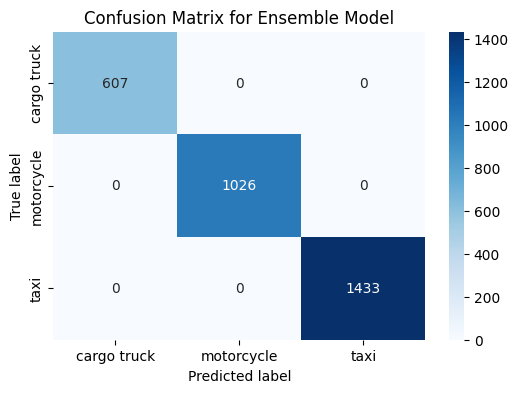

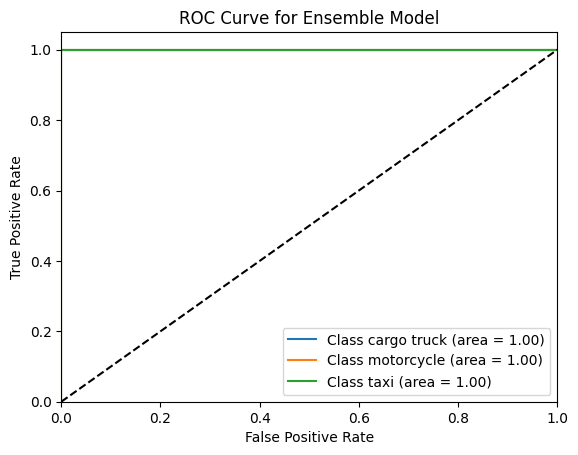

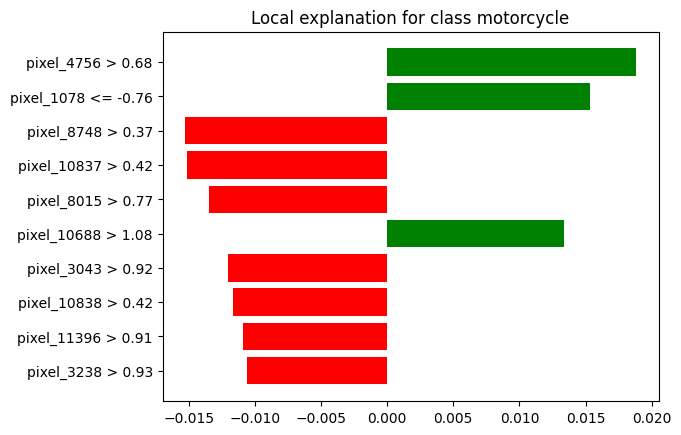

In [36]:
import lime
import lime.lime_tabular


# Define individual models
svm_model = SVC(kernel='linear', probability=True, random_state=42)
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
lr_model = LogisticRegression(random_state=42)

# Create an ensemble model using soft voting
ensemble_model = VotingClassifier(estimators=[('svm', svm_model), ('rf', rf_model), ('lr', lr_model)], voting='soft')

# Train the ensemble model
ensemble_model.fit(train_features_scaled, train_labels_encoded)

# Predict using the ensemble model
ensemble_predictions = ensemble_model.predict(test_features_scaled)
ensemble_predictions_proba = ensemble_model.predict_proba(test_features_scaled)

# Evaluate the ensemble model
ensemble_accuracy = accuracy_score(test_labels_encoded, ensemble_predictions)
ensemble_precision = precision_score(test_labels_encoded, ensemble_predictions, average='weighted')
ensemble_recall = recall_score(test_labels_encoded, ensemble_predictions, average='weighted')
ensemble_f1 = f1_score(test_labels_encoded, ensemble_predictions, average='weighted')
ensemble_auc_score = roc_auc_score(test_labels_encoded, ensemble_predictions_proba, multi_class='ovo')

print("Ensemble Model Accuracy:", ensemble_accuracy)
print("Ensemble Model Precision:", ensemble_precision)
print("Ensemble Model Recall:", ensemble_recall)
print("Ensemble Model F1 Score:", ensemble_f1)
print("Ensemble Model AUC:", ensemble_auc_score)

# Plot confusion matrix for the ensemble model
cm = confusion_matrix(test_labels_encoded, ensemble_predictions)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix for Ensemble Model')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

# Plot ROC-AUC curves for the ensemble model
plt.figure()
for i, class_label in enumerate(label_encoder.classes_):
    fpr, tpr, _ = roc_curve(test_labels_encoded == i, ensemble_predictions_proba[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'Class {class_label} (area = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Ensemble Model')
plt.legend(loc='lower right')
plt.show()

# Apply LIME to explain the ensemble model
explainer = lime.lime_tabular.LimeTabularExplainer(train_features_scaled,
                                                   feature_names=[f'pixel_{i}' for i in range(train_features_scaled.shape[1])],
                                                   class_names=label_encoder.classes_,
                                                   discretize_continuous=True,
                                                   random_state=42)

# Choose an instance to explain
i = 0  # First instance in the test set
instance = test_features_scaled[i]

# Get LIME explanation
exp = explainer.explain_instance(instance, ensemble_model.predict_proba, num_features=10)

# Show the explanation
exp.show_in_notebook(show_table=True, show_all=False)

# Plot the explanation
exp.as_pyplot_figure()
plt.show()


Classification based on Pixel value analysis

Support Vector Machine Accuracy: 1.0000
Support Vector Machine Precision: 1.0000
Support Vector Machine Recall: 1.0000
Support Vector Machine F1 Score: 1.0000
Support Vector Machine AUC: 1.0
Confusion Matrix:
 [[ 607    0    0]
 [   0 1026    0]
 [   0    0 1433]]
              precision    recall  f1-score   support

 cargo truck       1.00      1.00      1.00       607
  motorcycle       1.00      1.00      1.00      1026
        taxi       1.00      1.00      1.00      1433

    accuracy                           1.00      3066
   macro avg       1.00      1.00      1.00      3066
weighted avg       1.00      1.00      1.00      3066





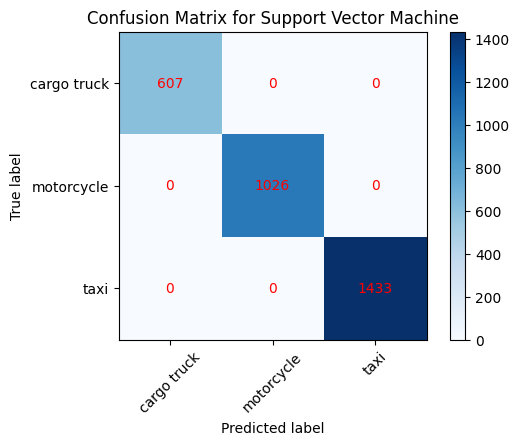

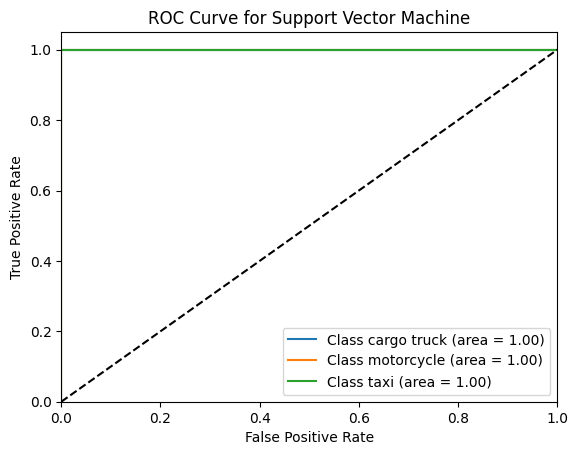

Random Forest Accuracy: 1.0000
Random Forest Precision: 1.0000
Random Forest Recall: 1.0000
Random Forest F1 Score: 1.0000
Random Forest AUC: 1.0
Confusion Matrix:
 [[ 607    0    0]
 [   0 1026    0]
 [   0    0 1433]]
              precision    recall  f1-score   support

 cargo truck       1.00      1.00      1.00       607
  motorcycle       1.00      1.00      1.00      1026
        taxi       1.00      1.00      1.00      1433

    accuracy                           1.00      3066
   macro avg       1.00      1.00      1.00      3066
weighted avg       1.00      1.00      1.00      3066





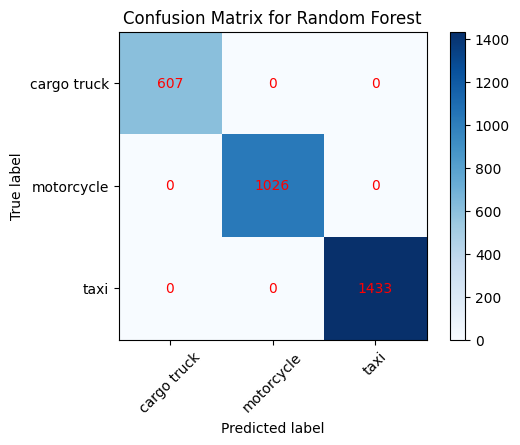

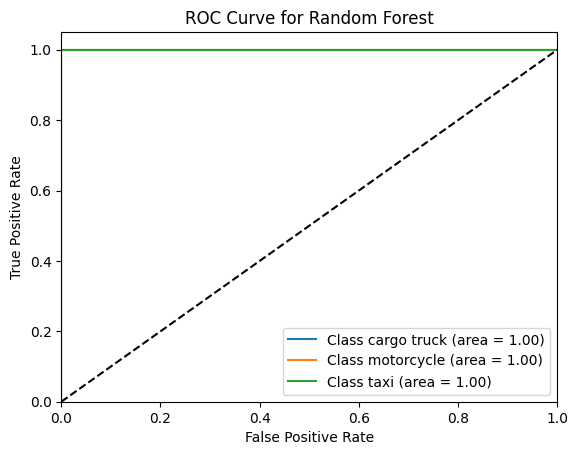

k-Nearest Neighbors Accuracy: 0.9948
k-Nearest Neighbors Precision: 0.9948
k-Nearest Neighbors Recall: 0.9948
k-Nearest Neighbors F1 Score: 0.9948
k-Nearest Neighbors AUC: 0.9999181240466651
Confusion Matrix:
 [[ 601    2    4]
 [   3 1020    3]
 [   2    2 1429]]
              precision    recall  f1-score   support

 cargo truck       0.99      0.99      0.99       607
  motorcycle       1.00      0.99      1.00      1026
        taxi       1.00      1.00      1.00      1433

    accuracy                           0.99      3066
   macro avg       0.99      0.99      0.99      3066
weighted avg       0.99      0.99      0.99      3066





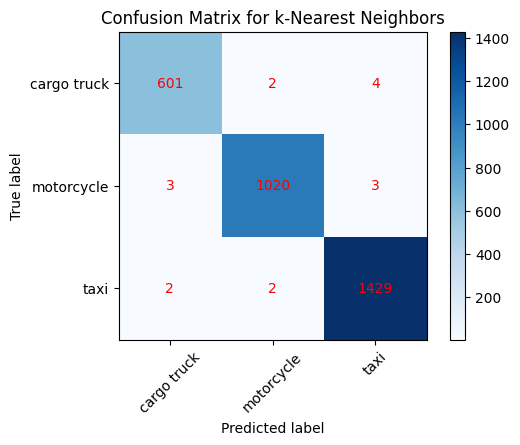

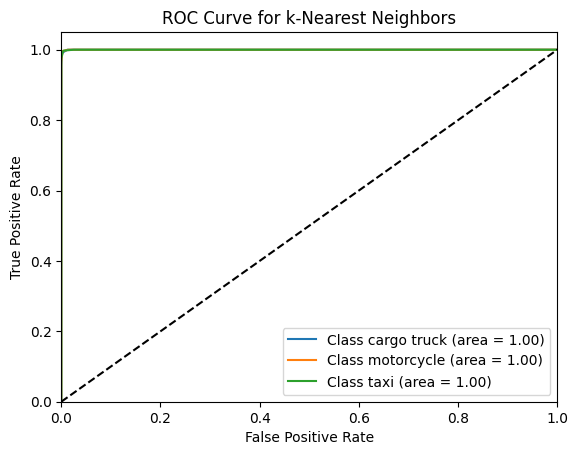

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Accuracy: 1.0000
Logistic Regression Precision: 1.0000
Logistic Regression Recall: 1.0000
Logistic Regression F1 Score: 1.0000
Logistic Regression AUC: 1.0
Confusion Matrix:
 [[ 607    0    0]
 [   0 1026    0]
 [   0    0 1433]]
              precision    recall  f1-score   support

 cargo truck       1.00      1.00      1.00       607
  motorcycle       1.00      1.00      1.00      1026
        taxi       1.00      1.00      1.00      1433

    accuracy                           1.00      3066
   macro avg       1.00      1.00      1.00      3066
weighted avg       1.00      1.00      1.00      3066





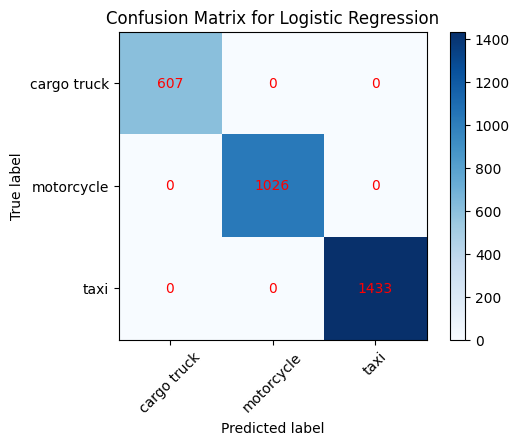

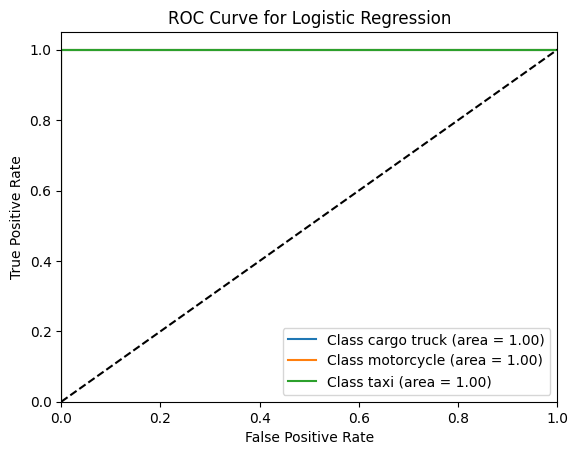

Decision Tree Accuracy: 1.0000
Decision Tree Precision: 1.0000
Decision Tree Recall: 1.0000
Decision Tree F1 Score: 1.0000
Decision Tree AUC: 1.0
Confusion Matrix:
 [[ 607    0    0]
 [   0 1026    0]
 [   0    0 1433]]
              precision    recall  f1-score   support

 cargo truck       1.00      1.00      1.00       607
  motorcycle       1.00      1.00      1.00      1026
        taxi       1.00      1.00      1.00      1433

    accuracy                           1.00      3066
   macro avg       1.00      1.00      1.00      3066
weighted avg       1.00      1.00      1.00      3066





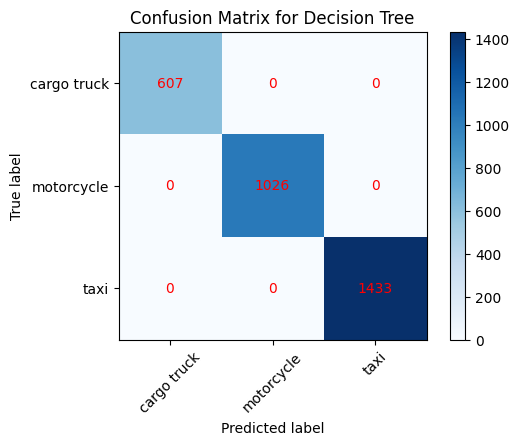

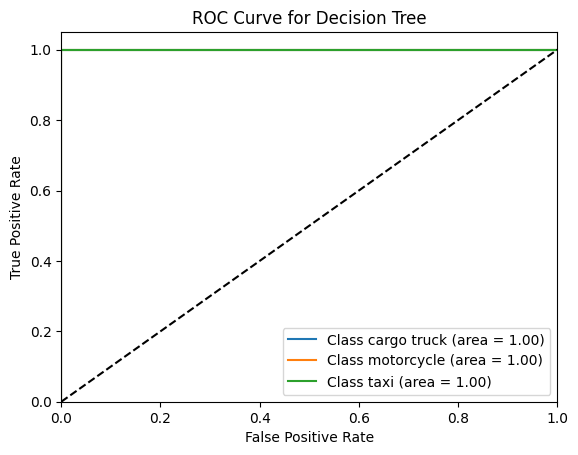

In [29]:
# Function to load and prepare data using pixel values
def load_data(directory, image_size):
    features = []
    labels = []
    for label_dir in os.listdir(directory):
        label_path = os.path.join(directory, label_dir)
        if os.path.isdir(label_path):
            for image_file in os.listdir(label_path):
                image_path = os.path.join(label_path, image_file)
                image = cv2.imread(image_path)  # Read the image in BGR color space
                if image is not None:
                    image_resized = cv2.resize(image, image_size)
                    features.append(image_resized.flatten())
                    labels.append(label_dir)
    return np.array(features), np.array(labels)

# Function to resize and flatten the image for pixel value analysis
def extract_pixel_values(image, size=(64, 64)):
    resized_image = cv2.resize(image, size)
    feature_vector = resized_image.flatten()
    return feature_vector

# Function to extract features and labels from a directory
def extract_features_from_folder(folder_path, feature_extractor):
    features = []
    labels = []

    class_folders = os.listdir(folder_path)
    for class_folder in class_folders:
        class_path = os.path.join(folder_path, class_folder)
        if os.path.isdir(class_path):
            class_label = class_folder

            image_files = os.listdir(class_path)

            for image_file in image_files:
                image_path = os.path.join(class_path, image_file)

                # Load the image
                image = cv2.imread(image_path)

                # Extract pixel value features
                extracted_features = feature_extractor(image)

                features.append(extracted_features)
                labels.append(class_label)

    return features, labels

# Paths
train_folder_path = '/content/drive/My Drive/final-organized'
test_folder_path = '/content/drive/My Drive/final-organized'

# Extract features and labels from training and test sets
train_features, train_labels = extract_features_from_folder(train_folder_path, extract_pixel_values)
test_features, test_labels = extract_features_from_folder(test_folder_path, extract_pixel_values)

# Encode labels
label_encoder = LabelEncoder()
train_labels_encoded = label_encoder.fit_transform(train_labels)
test_labels_encoded = label_encoder.transform(test_labels)

# Standardize features
scaler = StandardScaler()
train_features_scaled = scaler.fit_transform(train_features)
test_features_scaled = scaler.transform(test_features)

# Train and evaluate models
models = {
    "Support Vector Machine": SVC(kernel='linear', probability=True, random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "k-Nearest Neighbors": KNeighborsClassifier(n_neighbors=5),
    "Logistic Regression": LogisticRegression(random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42)
}

for model_name, model in models.items():
    model.fit(train_features_scaled, train_labels_encoded)
    predictions = model.predict(test_features_scaled)

    if hasattr(model, "predict_proba"):
        predictions_proba = model.predict_proba(test_features_scaled)
    else:
        predictions_proba = None

    accuracy = accuracy_score(test_labels_encoded, predictions)
    precision = precision_score(test_labels_encoded, predictions, average='weighted')
    recall = recall_score(test_labels_encoded, predictions, average='weighted')
    f1 = f1_score(test_labels_encoded, predictions, average='weighted')

    if predictions_proba is not None and predictions_proba.shape[1] > 1:
        auc_score = roc_auc_score(test_labels_encoded, predictions_proba, multi_class='ovo')
    else:
        auc_score = 'N/A'

    print(f"{model_name} Accuracy: {accuracy:.4f}")
    print(f"{model_name} Precision: {precision:.4f}")
    print(f"{model_name} Recall: {recall:.4f}")
    print(f"{model_name} F1 Score: {f1:.4f}")
    print(f"{model_name} AUC: {auc_score}")
    print("Confusion Matrix:\n", confusion_matrix(test_labels_encoded, predictions))
    print(classification_report(test_labels_encoded, predictions, target_names=label_encoder.classes_))
    print("\n")

    # Plot confusion matrix
    cm = confusion_matrix(test_labels_encoded, predictions)
    plt.figure(figsize=(6, 4))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix for {model_name}')
    plt.colorbar()
    tick_marks = np.arange(len(label_encoder.classes_))
    plt.xticks(tick_marks, label_encoder.classes_, rotation=45)
    plt.yticks(tick_marks, label_encoder.classes_)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    for i, j in np.ndindex(cm.shape):
        plt.text(j, i, cm[i, j], ha='center', va='center', color='red')

    plt.show()

    # Plot ROC-AUC curves
    if predictions_proba is not None and predictions_proba.shape[1] > 1:
        plt.figure()
        for i, class_label in enumerate(label_encoder.classes_):
            fpr, tpr, _ = roc_curve(test_labels_encoded == i, predictions_proba[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f'Class {class_label} (area = {roc_auc:.2f})')

        plt.plot([0, 1], [0, 1], 'k--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve for {model_name}')
        plt.legend(loc='lower right')
        plt.show()
